In [1]:
import pandas as pd 
import numpy as np 
import warnings  
import os 
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt

In [2]:
col_names = [
    'timestamp_start', 'open', 'high', 'low', 'close', 'volume', 
    'timestamp_end', 'quote_asset_volume', 'number_of_trades', 
    'taker_buy_base_asset_volume', 'taker_buy_quote_asset_volume', 'ignore'
]

### Timestamp df

In [3]:
sui_df = pd.read_csv('full_SUIUSDT_1m.csv')
sui_df.columns = col_names


# Set 'timestamp_start' as the index
sui_df.set_index('timestamp_start', inplace=True)
sui_df.head()

,open,high,low,close,volume,timestamp_end,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore
timestamp_start,,,,,,,,,,,
1683129600000,1.4030,1.4030,1.2652,1.3126,722490.7,1683129659999,9.486951e+05,2527,302457.8,398208.76764,0
1683129660000,1.3126,1.3194,1.2953,1.3063,800967.4,1683129719999,1.046050e+06,2963,418215.0,545979.82799,0
1683129720000,1.3063,1.3086,1.2859,1.2911,622276.0,1683129779999,8.067346e+05,1571,268541.6,348033.15939,0
1683129780000,1.2919,1.3030,1.2866,1.3010,504129.9,1683129839999,6.529472e+05,1584,317318.6,411141.04168,0
1683129840000,1.3010,1.3043,1.2946,1.2984,366021.3,1683129899999,4.754131e+05,1391,144897.9,188239.51960,0


### datetime df

In [4]:
sui = pd.read_csv('full_SUIUSDT_1m.csv')

sui.columns = col_names
sui['timestamp_start'] = pd.to_datetime(sui['timestamp_start'], unit='ms')
sui.set_index('timestamp_start', inplace=True)
sui['log_return'] = np.log(sui['close'] / sui['close'].shift(1))
sui.head()

,open,high,low,close,volume,timestamp_end,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,log_return
timestamp_start,,,,,,,,,,,,
2023-05-03 16:00:00,1.4030,1.4030,1.2652,1.3126,722490.7,1683129659999,9.486951e+05,2527,302457.8,398208.76764,0,NaN
2023-05-03 16:01:00,1.3126,1.3194,1.2953,1.3063,800967.4,1683129719999,1.046050e+06,2963,418215.0,545979.82799,0,-0.004811
2023-05-03 16:02:00,1.3063,1.3086,1.2859,1.2911,622276.0,1683129779999,8.067346e+05,1571,268541.6,348033.15939,0,-0.011704
2023-05-03 16:03:00,1.2919,1.3030,1.2866,1.3010,504129.9,1683129839999,6.529472e+05,1584,317318.6,411141.04168,0,0.007639
2023-05-03 16:04:00,1.3010,1.3043,1.2946,1.2984,366021.3,1683129899999,4.754131e+05,1391,144897.9,188239.51960,0,-0.002000


In [5]:
sui.tail()

,open,high,low,close,volume,timestamp_end,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,log_return
timestamp_start,,,,,,,,,,,,
2024-11-30 23:55:00,3.4880,3.4880,3.4781,3.4785,69110.8,1733010959999,240685.07585,902,11693.8,40717.11895,0,-0.002756
2024-11-30 23:56:00,3.4785,3.4814,3.4785,3.4805,42983.6,1733011019999,149607.25097,678,20101.2,69959.81676,0,0.000575
2024-11-30 23:57:00,3.4804,3.4805,3.4746,3.4784,217754.6,1733011079999,757077.81956,1661,41007.7,142577.35901,0,-0.000604
2024-11-30 23:58:00,3.4784,3.4808,3.4775,3.4781,71245.4,1733011139999,247846.70243,778,40122.4,139581.41247,0,-0.000086
2024-11-30 23:59:00,3.4781,3.4790,3.4769,3.4774,43627.8,1733011199999,151732.34644,632,21534.7,74892.78792,0,-0.000201


### Analyze the given data:
#### start: 2023-05-03 16:00:00
#### end: 2024-11-30 23:59:00

In [6]:
from datetime import datetime

# Define start and end times
start_time = datetime(2023, 5, 3, 16, 00, 0)
end_time = datetime(2024, 11, 30, 23, 59, 0)

# Calculate difference in days
delta = end_time - start_time
total_days = delta.days

# Convert total days to minutes
total_minutes = total_days * 1440 + (end_time.hour * 60 + end_time.minute) - (start_time.hour * 60 + start_time.minute)

total_days, total_minutes

(577, 831359)

### Before & After BTC Jumps

In [7]:
pos_ts, neg_ts = pd.read_csv("positive_timestamps.csv"), pd.read_csv("negative_timestamps.csv")
pos_ts.columns = ['timestamp']
neg_ts.columns = ['timestamp']
pos_ts.head()  # now in df 

,timestamp
0,1577115180000
1,1577117160000
2,1577117220000
3,1577117460000
4,1577117580000


In [8]:
pos_ts_array = np.array(pos_ts['timestamp'])  
neg_ts_array = np.array(neg_ts['timestamp'])  
pos_ts_array

array([1577115180000, 1577117160000, 1577117220000, ..., 1732915500000,
       1732946220000, 1732947060000])

In [9]:
print(len(pos_ts_array) == len(neg_ts_array))
print(len(pos_ts_array))

True
75435


### Searching Timestamp

In [10]:
sui_df['log_return'] = np.log(sui_df['close'] / sui_df['close'].shift(1))

sui_df.head()

,open,high,low,close,volume,timestamp_end,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,log_return
timestamp_start,,,,,,,,,,,,
1683129600000,1.4030,1.4030,1.2652,1.3126,722490.7,1683129659999,9.486951e+05,2527,302457.8,398208.76764,0,NaN
1683129660000,1.3126,1.3194,1.2953,1.3063,800967.4,1683129719999,1.046050e+06,2963,418215.0,545979.82799,0,-0.004811
1683129720000,1.3063,1.3086,1.2859,1.2911,622276.0,1683129779999,8.067346e+05,1571,268541.6,348033.15939,0,-0.011704
1683129780000,1.2919,1.3030,1.2866,1.3010,504129.9,1683129839999,6.529472e+05,1584,317318.6,411141.04168,0,0.007639
1683129840000,1.3010,1.3043,1.2946,1.2984,366021.3,1683129899999,4.754131e+05,1391,144897.9,188239.51960,0,-0.002000


### Sorting Timestamp
#### - t(0) - t(5)
#### - t(5) - t(10)
#### - t(-5) - t(0)

In [11]:
""" change here to look at different window """ 


pos_ts_start  = pos_ts_array + (0 * 60 * 1000)
pos_ts_end = pos_ts_start + (5 * 60 * 1000)
neg_ts_start  = neg_ts_array + (0 * 60 * 1000)
neg_ts_end = neg_ts_start + (5 * 60 * 1000)

In [35]:
# type : a list of list 
pos_ts1_5 = [[start, end] for start, end in zip(pos_ts_start, pos_ts_end)]
neg_ts1_5 = [[start, end] for start, end in zip(neg_ts_start, neg_ts_end)]

In [36]:
pos_ts1_5_arr = np.array(pos_ts1_5)  # Shape: (n, 2)
neg_ts1_5_arr = np.array(neg_ts1_5)  # Shape: (n, 2)

In [59]:
# POS 
sui_timestamps = sui_df.index.values  # Get the timestamp_start values as an array

valid_ranges = []
for start, end in pos_ts1_5_arr:
    # Filter rows within the range
    filtered_range = sui_df.loc[start:end, 'log_return']
    if not filtered_range.empty:
        valid_ranges.append((start, end, filtered_range.tolist()))

# Process results into a structured list
result1 = [{"range": [start, end], "log_returns": log_returns} for start, end, log_returns in valid_ranges]


for item in result1:
     print(f"Range {item['range']} -> Log Returns: {item['log_returns']}")


Range [1683131040000, 1683131340000] -> Log Returns: [-0.009847984174391691, 0.007158540430827904, -0.00021838034663676585, -0.002770286819460953, -0.004536482500056833, 0.005849680325017149]
Range [1683132540000, 1683132840000] -> Log Returns: [0.0071475761955398075, 0.003989125870182236, 0.004117461662806313, -0.00527629426876868, 0.005060007904780867, -0.003828792829820712]
Range [1683134640000, 1683134940000] -> Log Returns: [0.0026122937720217633, 0.0019547517536560007, -0.005657518535485813, -0.00029099374568789833, 0.0018899474986638993, 0.003624505598960298]
Range [1683135660000, 1683135960000] -> Log Returns: [-0.0004417936895362921, 0.003528896472021214, -0.002130552177927525, 0.001029109176387639, -0.00036741742706749366, -0.006118932431646309]
Range [1683136680000, 1683136980000] -> Log Returns: [0.002488407572934602, 0.00398361983457216, 0.002921240982311984, 0.009824431505827068, 0.0019977070015444695, -0.00029570488867795163]
Range [1683136920000, 1683137220000] -> Log R

In [65]:
# NEG 

sui_timestamps = sui_df.index.values  # Get the timestamp_start values as an array

valid_ranges = []
for start, end in neg_ts1_5_arr:
    # Filter rows within the range
    filtered_range = sui_df.loc[start:end, 'log_return']
    if not filtered_range.empty:
        valid_ranges.append((start, end, filtered_range.tolist()))

# Process results into a structured list
result2 = [{"range": [start, end], "log_returns": log_returns} for start, end, log_returns in valid_ranges]

for item in result2:
     print(f"Range {item['range']} -> Log Returns: {item['log_returns']}")

Range [1683132720000, 1683133020000] -> Log Returns: [-0.00527629426876868, 0.005060007904780867, -0.003828792829820712, 0.0008681812150005926, -0.0007234319927749944, -0.004206257561405527]
Range [1683135780000, 1683136080000] -> Log Returns: [-0.002130552177927525, 0.001029109176387639, -0.00036741742706749366, -0.006118932431646309, -0.004743912239644087, -0.001710355501532363]
Range [1683136560000, 1683136860000] -> Log Returns: [-0.008904911614872496, -0.00444461916659355, 0.002488407572934602, 0.00398361983457216, 0.002921240982311984, 0.009824431505827068]
Range [1683136860000, 1683137160000] -> Log Returns: [0.009824431505827068, 0.0019977070015444695, -0.00029570488867795163, -0.00022183606405907998, -0.003110883184325129, -0.009316258922236897]
Range [1683138840000, 1683139140000] -> Log Returns: [-0.0027124790591188876, -0.006206029151917258, 0.010572519564735044, -0.006859409550893031, 0.004076092600042714, 0.003459170241323356]
Range [1683138900000, 1683139200000] -> Log R

In [66]:
# Sum the first 5 log return
#POS
for item in result1:
    log_returns = item["log_returns"]
    # Sum the first 5 log returns
    ts1_5_log_ret = sum(log_returns[:-1])  
    item["ts1_5_sum"] = ts1_5_log_ret  # Add to the dictionary

for item in result1:
    print(f"Range {item['range']} -> Log Returns: {item['log_returns']}, Log Return sum: {item['ts1_5_sum']}")

Range [1683131040000, 1683131340000] -> Log Returns: [-0.009847984174391691, 0.007158540430827904, -0.00021838034663676585, -0.002770286819460953, -0.004536482500056833, 0.005849680325017149], Log Return sum: -0.01021459340971834
Range [1683132540000, 1683132840000] -> Log Returns: [0.0071475761955398075, 0.003989125870182236, 0.004117461662806313, -0.00527629426876868, 0.005060007904780867, -0.003828792829820712], Log Return sum: 0.015037877364540543
Range [1683134640000, 1683134940000] -> Log Returns: [0.0026122937720217633, 0.0019547517536560007, -0.005657518535485813, -0.00029099374568789833, 0.0018899474986638993, 0.003624505598960298], Log Return sum: 0.0005084807431679518
Range [1683135660000, 1683135960000] -> Log Returns: [-0.0004417936895362921, 0.003528896472021214, -0.002130552177927525, 0.001029109176387639, -0.00036741742706749366, -0.006118932431646309], Log Return sum: 0.0016182423538775423
Range [1683136680000, 1683136980000] -> Log Returns: [0.002488407572934602, 0.00

In [62]:
# NEG
for item in result1:
    log_returns = item["log_returns"]
    # Sum the first 5 log returns
    ts1_5_log_ret = sum(log_returns)  
    item["ts1_5_sum"] = ts1_5_log_ret  # Add to the dictionary

for item in result1:
    print(f"Range {item['range']} -> Log Returns: {item['log_returns']}, Log Return sum: {item['ts1_5_sum']}")

Range [1683131040000, 1683131340000] -> Log Returns: [-0.009847984174391691, 0.007158540430827904, -0.00021838034663676585, -0.002770286819460953, -0.004536482500056833, 0.005849680325017149], Log Return sum: -0.004364913084701191
Range [1683132540000, 1683132840000] -> Log Returns: [0.0071475761955398075, 0.003989125870182236, 0.004117461662806313, -0.00527629426876868, 0.005060007904780867, -0.003828792829820712], Log Return sum: 0.011209084534719832
Range [1683134640000, 1683134940000] -> Log Returns: [0.0026122937720217633, 0.0019547517536560007, -0.005657518535485813, -0.00029099374568789833, 0.0018899474986638993, 0.003624505598960298], Log Return sum: 0.00413298634212825
Range [1683135660000, 1683135960000] -> Log Returns: [-0.0004417936895362921, 0.003528896472021214, -0.002130552177927525, 0.001029109176387639, -0.00036741742706749366, -0.006118932431646309], Log Return sum: -0.004500690077768766
Range [1683136680000, 1683136980000] -> Log Returns: [0.002488407572934602, 0.003

In [63]:
result1

[{'range': [1683131040000, 1683131340000],
  'log_returns': [-0.009847984174391691,
   0.007158540430827904,
   -0.00021838034663676585,
   -0.002770286819460953,
   -0.004536482500056833,
   0.005849680325017149],
  'ts1_5_sum': -0.004364913084701191},
 {'range': [1683132540000, 1683132840000],
  'log_returns': [0.0071475761955398075,
   0.003989125870182236,
   0.004117461662806313,
   -0.00527629426876868,
   0.005060007904780867,
   -0.003828792829820712],
  'ts1_5_sum': 0.011209084534719832},
 {'range': [1683134640000, 1683134940000],
  'log_returns': [0.0026122937720217633,
   0.0019547517536560007,
   -0.005657518535485813,
   -0.00029099374568789833,
   0.0018899474986638993,
   0.003624505598960298],
  'ts1_5_sum': 0.00413298634212825},
 {'range': [1683135660000, 1683135960000],
  'log_returns': [-0.0004417936895362921,
   0.003528896472021214,
   -0.002130552177927525,
   0.001029109176387639,
   -0.00036741742706749366,
   -0.006118932431646309],
  'ts1_5_sum': -0.0045006900

In [67]:
for item in result2:
    log_returns = item["log_returns"]
    ts1_5_log_ret = sum(log_returns)  
    item["ts1_5_sum"] = ts1_5_log_ret


In [68]:
ts1_5_log_ret = sum(log_returns[:5])


In [69]:
ts1_5_pos_sum = [item['ts1_5_sum'] for item in result1]
ts1_5_neg_sum = [item['ts1_5_sum'] for item in result2]


In [70]:
ts0_5_ts = [item['range'] for item in result1]
len(ts0_5_ts) 

11897

### Resample to 5min

In [43]:
sui

,open,high,low,close,volume,timestamp_end,quote_asset_volume,number_of_trades,taker_buy_base_asset_volume,taker_buy_quote_asset_volume,ignore,log_return
timestamp_start,,,,,,,,,,,,
2023-05-03 16:00:00,1.4030,1.4030,1.2652,1.3126,722490.7,1683129659999,9.486951e+05,2527,302457.8,398208.76764,0,NaN
2023-05-03 16:01:00,1.3126,1.3194,1.2953,1.3063,800967.4,1683129719999,1.046050e+06,2963,418215.0,545979.82799,0,-0.004811
2023-05-03 16:02:00,1.3063,1.3086,1.2859,1.2911,622276.0,1683129779999,8.067346e+05,1571,268541.6,348033.15939,0,-0.011704
2023-05-03 16:03:00,1.2919,1.3030,1.2866,1.3010,504129.9,1683129839999,6.529472e+05,1584,317318.6,411141.04168,0,0.007639
2023-05-03 16:04:00,1.3010,1.3043,1.2946,1.2984,366021.3,1683129899999,4.754131e+05,1391,144897.9,188239.51960,0,-0.002000
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-30 23:55:00,3.4880,3.4880,3.4781,3.4785,69110.8,1733010959999,2.406851e+05,902,11693.8,40717.11895,0,-0.002756
2024-11-30 23:56:00,3.4785,3.4814,3.4785,3.4805,42983.6,1733011019999,1.496073e+05,678,20101.2,69959.81676,0,0.000575
2024-11-30 23:57:00,3.4804,3.4805,3.4746,3.4784,217754.6,1733011079999,7.570778e+05,1661,41007.7,142577.35901,0,-0.000604


In [44]:
sui.index = pd.to_datetime(sui.index)

# Resample the data to 5-minute intervals and sum all values
sui_1min = sui.resample('5T').sum()

# Print the resampled DataFrame
total_log_r = sui_1min['log_return']
total_log_r

timestamp_start
2023-05-03 16:00:00   -0.010877
2023-05-03 16:05:00    0.025474
2023-05-03 16:10:00    0.001426
2023-05-03 16:15:00    0.023489
2023-05-03 16:20:00   -0.001026
                         ...   
2024-11-30 23:35:00    0.006359
2024-11-30 23:40:00   -0.001229
2024-11-30 23:45:00   -0.001488
2024-11-30 23:50:00   -0.001347
2024-11-30 23:55:00   -0.003072
Freq: 5T, Name: log_return, Length: 166272, dtype: float64

In [72]:
pos_jump = ts1_5_pos_sum
neg_jump = ts1_5_neg_sum

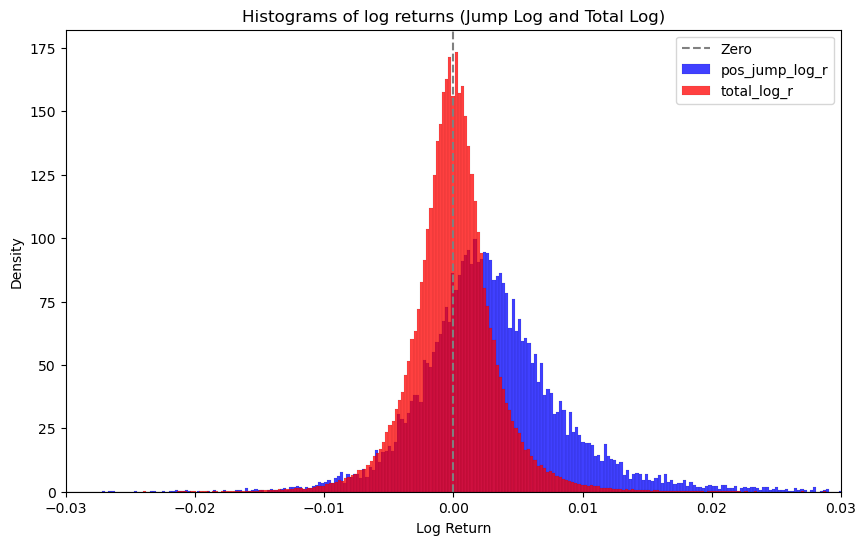

In [76]:
#POS
import seaborn as sns
# Plotting the histograms
plt.figure(figsize=(10, 6))

# Plot histogram for jump_log_r
sns.histplot(pos_jump, bins=1000, kde=False, color='blue', label='pos_jump_log_r', stat='density', edgecolor='black')

# Plot histogram for total_log_r
sns.histplot(total_log_r, bins=1000, kde=False, color='red', label='total_log_r', stat='density', edgecolor='black')

# Customize the plot
plt.axvline(0, color='gray', linestyle='--', label='Zero')
plt.title('Histograms of log returns (Jump Log and Total Log)')
plt.xlabel('Log Return')
plt.ylabel('Density')
plt.legend()
plt.xlim(-0.03, 0.03)

# Show plot
plt.show()

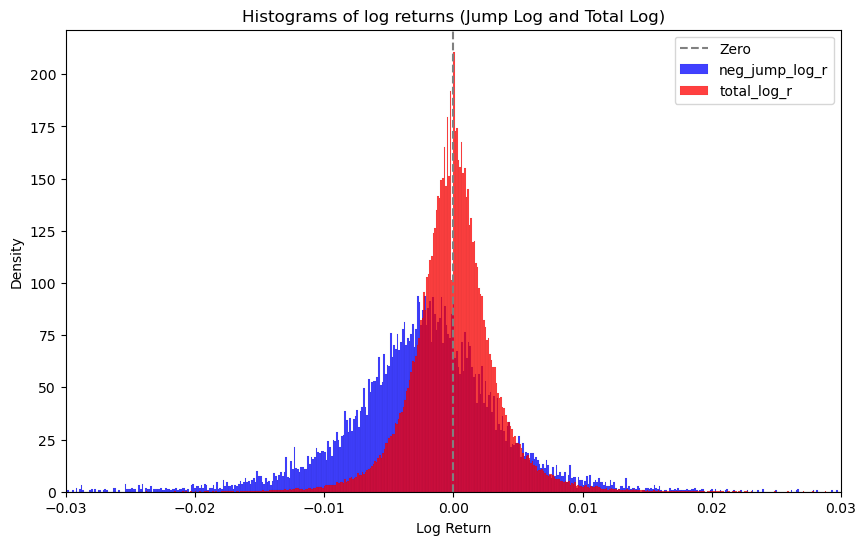

In [77]:
# NEG

plt.figure(figsize=(10, 6))

# Plot histogram for jump_log_r
sns.histplot(neg_jump, bins=2000, kde=False, color='blue', label='neg_jump_log_r', stat='density', edgecolor='black')

# Plot histogram for total_log_r
sns.histplot(total_log_r, bins=2000, kde=False , color='red', label='total_log_r', stat='density', edgecolor='black')

# Customize the plot
plt.axvline(0, color='gray', linestyle='--', label='Zero')
plt.title('Histograms of log returns (Jump Log and Total Log)')
plt.xlabel('Log Return')
plt.ylabel('Density')
plt.legend()
plt.xlim(-0.03, 0.03)

# Show plot
plt.show()

In [78]:
len(neg_jump), len(pos_jump), len(total_log_r)

(12049, 11897, 166272)

### Intraday Analysis

In [79]:
ts0_5_ts = np.array(ts0_5_ts)
ts0_5_ts

array([[1683131040000, 1683131340000],
       [1683132540000, 1683132840000],
       [1683134640000, 1683134940000],
       ...,
       [1732915500000, 1732915800000],
       [1732946220000, 1732946520000],
       [1732947060000, 1732947360000]])

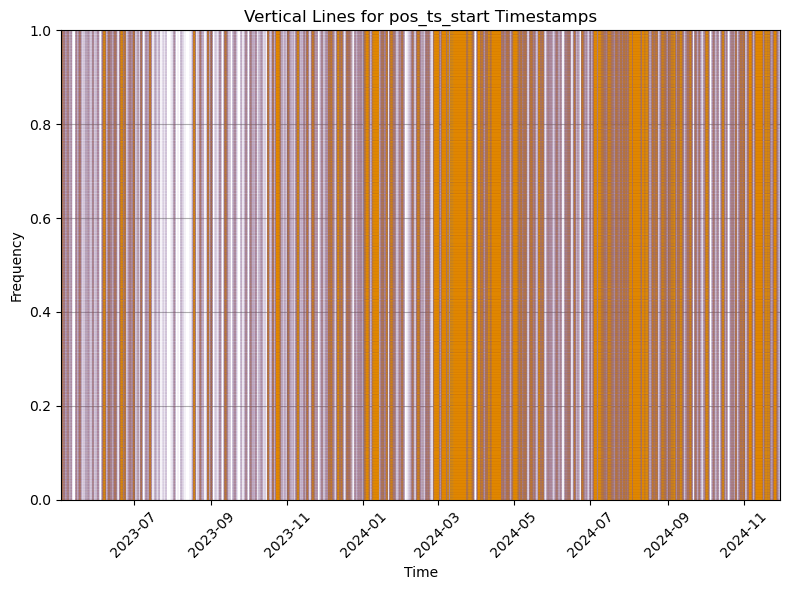

In [81]:
# Convert the Unix timestamps to pandas datetime objects (start times)
sui_ts_btcj_start = pd.to_datetime(ts0_5_ts[:, 0], unit='ms')
sui_ts_btcj_end = pd.to_datetime(ts0_5_ts[:, 1], unit='ms')

# Create a time range from the very first to the very last timestamp with 1-minute intervals
time_range = pd.date_range(start=sui_ts_btcj_start.min(), end=sui_ts_btcj_end.max(), freq='T')

# Plotting the vertical lines
plt.figure(figsize=(8, 6))

# Plot vertical lines for each timestamp in sui_ts_btcj (converted from ts0_5_ts)
for ts in sui_ts_btcj_start:
    plt.axvline(ts, color='blue', linewidth=0.1, alpha=0.8, linestyle='--')
for ts in sui_ts_btcj_end:
    plt.axvline(ts, color='orange', linewidth=0.1, alpha=0.6, linestyle='--')
# Customize the plot
plt.title('Vertical Lines for pos_ts_start Timestamps')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.xlim(time_range[0], time_range[-1])
plt.grid(True)
plt.tight_layout()

# Show plot
plt.show()

In [56]:
sui_ts_btcj_start

DatetimeIndex(['2023-05-03 16:24:00', '2023-05-03 16:49:00',
               '2023-05-03 17:24:00', '2023-05-03 17:41:00',
               '2023-05-03 17:58:00', '2023-05-03 18:02:00',
               '2023-05-03 18:07:00', '2023-05-03 18:15:00',
               '2023-05-03 18:33:00', '2023-05-03 18:39:00',
               ...
               '2024-11-28 14:08:00', '2024-11-28 15:03:00',
               '2024-11-28 15:24:00', '2024-11-28 21:04:00',
               '2024-11-29 02:10:00', '2024-11-29 02:43:00',
               '2024-11-29 17:30:00', '2024-11-29 21:25:00',
               '2024-11-30 05:57:00', '2024-11-30 06:11:00'],
              dtype='datetime64[ns]', length=11897, freq=None)

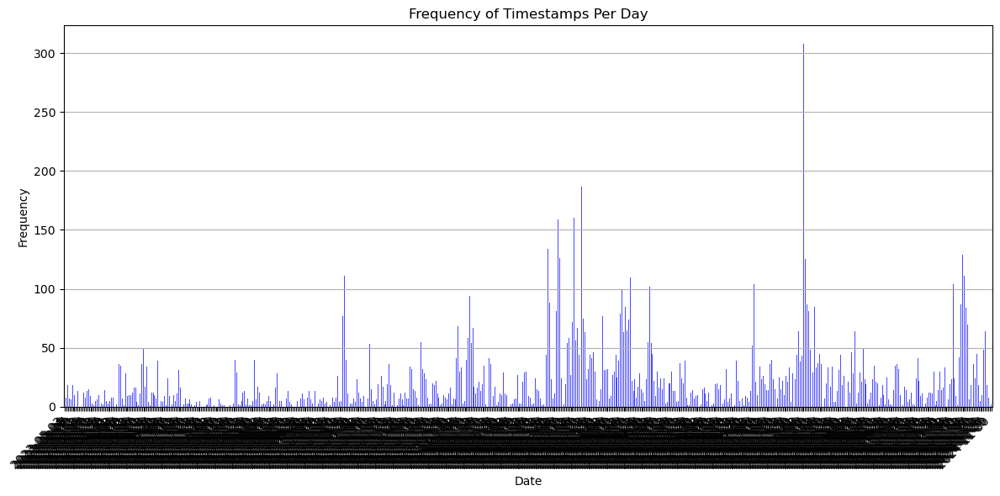

In [57]:
# Convert the Unix timestamps to pandas datetime objects (start times)
sui_ts_btcj_start = pd.to_datetime(ts0_5_ts[:, 0], unit='ms')

# Set the date as x-axis (each tick is a day)
sui_ts_btcj_start_dates = sui_ts_btcj_start.date

# Create a DataFrame to count the frequency of timestamps for each day
date_counts = pd.Series(sui_ts_btcj_start_dates).value_counts().sort_index()

# Generate a complete date range from the minimum to the maximum date
date_range = pd.date_range(start=sui_ts_btcj_start.min().date(), end=sui_ts_btcj_start.max().date(), freq='D')

# Reindex date_counts to include all days in the date_range
date_counts = date_counts.reindex(date_range.date, fill_value=0)

# Plotting the frequency of timestamps per day
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='blue', alpha=0.7)

# Customize the plot
plt.title('Frequency of Timestamps Per Day')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.grid(True, axis='y')
plt.tight_layout()

# Show plot
plt.show()